In [2]:
import torch
from torch.utils.data import Dataset, DataLoader
import os, os.path 
import numpy 
import pickle
from glob import glob


"""Change to the data folder"""
new_path = "./new_train/new_train"
validation_path = "./new_val_in/new_val_in"
# number of sequences in each dataset
# train:205942  val:3200 test: 36272 
# sequences sampled at 10HZ rate

### Create a dataset class 

In [3]:
class ArgoverseDataset(Dataset):
    """Dataset class for Argoverse"""
    def __init__(self, data_path: str, transform=None):
        super(ArgoverseDataset, self).__init__()
        self.data_path = data_path
        self.transform = transform

        self.pkl_list = glob(os.path.join(self.data_path, '*'))
        self.pkl_list.sort()
        
    def __len__(self):
        return len(self.pkl_list)

    def __getitem__(self, idx):

        pkl_path = self.pkl_list[idx]
        with open(pkl_path, 'rb') as f:
            data = pickle.load(f)
            
        if self.transform:
            data = self.transform(data)

        return data


# intialize a dataset
val_dataset  = ArgoverseDataset(data_path=new_path)
validation_dataset = ArgoverseDataset(data_path=validation_path)

### Create a loader to enable batch processing

In [13]:
'''DNN4用全部60个[x y vx vy]预测tv的下次vx vy'''
import math
import numpy as np
batch_sz = 2*11*11

def my_collate(batch):
    batch_num = len(batch)
    """ collate lists of samples into batches, create [ batch_sz x agent_sz x seq_len x feature] """
    inp = [numpy.dstack([scene['p_in'], scene['v_in']]) for scene in batch]
    out = [numpy.dstack([scene['p_out'], scene['v_out']]) for scene in batch]
    
    '''get target vehicle index in each scene'''
    track_id = [scene['track_id'] for scene in batch]
    agent_id = [scene['agent_id'] for scene in batch]
    agent_idx = numpy.zeros((batch_num,1))
    for i in range(batch_num):
        for j in range(60):
            if track_id[i][j][0][0] == agent_id[i]:
                agent_idx[i] = j
    
    inp = torch.FloatTensor(inp)
    out = torch.FloatTensor(out)
    return [inp, out, agent_idx]

def my_collate_2(batch):
    inp = [numpy.dstack([scene['p_in'], scene['v_in']]) for scene in batch]
    inp = torch.FloatTensor(inp)
    batch_num = len(batch)
    '''get target vehicle index in each scene'''
    track_id = [scene['track_id'] for scene in batch]
    agent_id = [scene['agent_id'] for scene in batch]
    agent_idx = numpy.zeros((batch_num,1))
    for i in range(batch_num):
        for j in range(60):
            if track_id[i][j][0][0] == agent_id[i]:
                agent_idx[i] = j
        
    '''get scene id for each scene'''
    scene_idx = [scene['scene_idx'] for scene in batch]
    
    return [inp,agent_idx,scene_idx]

val_loader = DataLoader(val_dataset,batch_size=batch_sz, shuffle = True, collate_fn=my_collate, num_workers=8)

validation_loader = DataLoader(validation_dataset,batch_size=1,shuffle=False,collate_fn=my_collate_2,num_workers=1)

In [37]:
'''DNN4用全部60个[x y vx vy]预测tv的下次vx vy'''

import torch
from torch import nn
import matplotlib.pyplot as plt
import torch.nn.functional as F
device='cuda' if torch.cuda.is_available() else 'cpu'
print("Using {} device".format(device))

'''Simple Linear Model'''
class DNN4(nn.Module):
    def __init__(self):
        super(DNN4,self).__init__()
#         self.linear1 = nn.Linear(in_features=240*5,out_features=240*5)
#         self.linear2 = nn.Linear(in_features=240*5,out_features=120*5)
#         self.linear3 = nn.Linear(in_features=120*5,out_features=60*5)
#         self.linear4 = nn.Linear(in_features=60*5,out_features=30*5)
#         self.linear5 = nn.Linear(in_features=30*5,out_features=2*5)
#         self.linear6 = nn.Linear(10,5)
#         self.linear7 = nn.Linear(5,3)
#         self.linear8 = nn.Linear(3,2)
#         self.dropout = nn.Dropout(0.2)
        self.batch = nn.BatchNorm1d(240)
        
        self.linear1 = nn.Linear(240,240)
        self.linear2 = nn.Linear(240,120)
        self.linear3 = nn.Linear(120,2)


#         self.conv1 = nn.Conv2d(1,1,4)
#         self.conv2 = nn.Conv2d(1,2,(57,1))
        
#         self.linear3 = nn.Linear(120,2)
#         self.conv = nn.Conv1d(in_channels=1,out_channels=2,kernel_size=4,stride=4)
#         self.linear2 = nn.Linear(14,12)#给target的位置信息,得到与target的位置差
#         self.linear3 = nn.Linear(14,2)#给target的速度
        
    def forward(self,x,tvv,tvxy):
#         x = F.tanh(self.conv1(self.batch(x).reshape((batch_sz,1,60,4))))
#         x = self.conv2(x)
#         x = x.reshape((batch_sz,-1))
        x = F.tanh(self.linear1(self.batch(x)))
        x = F.tanh(self.linear2(self.batch(x)))
        x = self.linear3(x)

#         x = self.linear3(x)
#         x = self.conv(x.reshape((batch_sz,1,24)))#242 x 2 x 60
#         x = self.linear2(torch.cat((x.reshape((batch_sz,-1)),tvxy),dim=1))
#         x = self.linear3(torch.cat((x,tvv),dim=1))

        return x
        
    def test_forward(self,x,tvv,tvxy):
        '''x: 242 x 240'''
        '''tvv: 242 x 2'''
#         x = F.tanh(self.conv1(self.batch(x).reshape((batch_sz,1,60,4))))
#         x = self.conv2(x)
#         x = x.reshape((batch_sz,-1))
        
        x = F.tanh(self.linear1(self.batch(x)))
        x = F.tanh(self.linear2(self.batch(x)))
        x = self.linear3(x)
        
#         x = self.linear3(x)
#         x = self.conv(x.reshape((batch_sz,1,24)))#242 x 2 x 60
#         x = self.linear2(torch.cat((x.reshape((batch_sz,-1)),tvxy),dim=1))
#         x = self.linear3(torch.cat((x,tvv),dim=1))
        
        return x
    
model4 = DNN4().to(device)
print(model4)
optimizer = torch.optim.Adam(model4.parameters(),lr=1e-3)



Using cuda device
DNN4(
  (batch): BatchNorm1d(240, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (linear1): Linear(in_features=240, out_features=240, bias=True)
  (linear2): Linear(in_features=240, out_features=120, bias=True)
  (linear3): Linear(in_features=120, out_features=2, bias=True)
)


In [38]:
'''DNN4用全部60个[x y vx vy]预测tv的下次vx vy'''
import time
from torch.autograd import Variable
num_epochs = 11
loss_ema = -1
loss_ema2 = -1

model4.train()
for epoch in range(num_epochs):
    t0 = time.time()
    loss_over_time = []
    for i_batch, sample_batch in enumerate(val_loader):
        inp, out, agent_idx = sample_batch
        inp = inp.to(device)#242 x 60 x 19 x 4
        out = out.to(device)#242 x 60 x 30 x 4
        
        mixed = torch.cat((inp,out),dim=2)#242 x 60 x 49 x 4
        mixed = torch.transpose(mixed, 2,1)# 242 x 49 x 60 x 4
        
        #242 x 49 x 2
        for i in range(batch_sz):
            if i == 0:
                groundtruth = mixed[i,:,int(agent_idx[i]),:][:,2:].reshape(1,49,2)
                tvxy = mixed[i,:,int(agent_idx[i]),:][:,:2].reshape(1,49,2)
            else:
                groundtruth = torch.cat((groundtruth,mixed[i,:,int(agent_idx[i]),:][:,2:].reshape(1,49,2)),dim=0)#49 x 4
                tvxy = torch.cat((tvxy,mixed[i,:,int(agent_idx[i]),:][:,:2].reshape(1,49,2)),dim=0)#49 x 4
        
#         for i in range(49):
#             for j in range(60):
#                 mixed[:,i,j,0] = mixed[:,i,j,0] - mixed[:,i,int(agent_idx[i]),0]
#                 mixed[:,i,j,1] = mixed[:,i,j,1] - mixed[:,i,int(agent_idx[i]),1]
            
        first = mixed[:,:,0]
        target = mixed[:,:,int(agent_idx[i])]
        mixed[:,:,0] = target
        mixed[:,:,int(agent_idx[i])] = first
            
        '''training'''
        for i in range(44):
            print('\n++++++++++++++\n')
            #y_pred = 242 x 49 x 240
            y_pred = model4(mixed[:,i].reshape((batch_sz,-1)),groundtruth[:,i],tvxy[:,i])#242 x 240
            loss = (torch.mean((y_pred - groundtruth[:,i+1])**2))**0.5
            loss_over_time.append(loss)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            if loss_ema <0:
                loss_ema = loss
            loss_ema = loss_ema*0.99+loss*0.01

            with torch.no_grad():
                test_y = model4(mixed[:,i].reshape((batch_sz,-1)),groundtruth[:,i],tvxy[:,i])
                print('predict x:',test_y[0,0], 'predict y:',test_y[0,1])
                print('true x: ',groundtruth[0,i+1,0],'true y:',groundtruth[0,i+1,1])
                test_loss = (torch.mean((test_y - groundtruth[:,i+1])**2))**0.5
                if loss_ema2 < 0:
                    loss_ema2 = test_loss
                loss_ema2 = loss_ema*0.99+loss*0.01
        if i_batch%10 == 0:
            print('loss full','epoch=',epoch, 'batch=',i_batch,'ema=',loss_ema.item(),'loss=',loss.item())
            print('loss test','epoch=',epoch, 'batch=',i_batch,'ema=',loss_ema2.item(),'loss=',test_loss.item())
    t1 = time.time()
    plt.figure(figsize=(8,4))
    plt.plot(loss_over_time, label='Train Loss')
    plt.show()   
    
    total = t1-t0
    print('epoch time:',total)
            
            


++++++++++++++

predict x: tensor(0.0592, device='cuda:0') predict y: tensor(0.2312, device='cuda:0')
true x:  tensor(0.3250, device='cuda:0') true y: tensor(9.4712, device='cuda:0')

++++++++++++++

predict x: tensor(-0.0622, device='cuda:0') predict y: tensor(0.4097, device='cuda:0')
true x:  tensor(0.4912, device='cuda:0') true y: tensor(9.6072, device='cuda:0')

++++++++++++++

predict x: tensor(0.1772, device='cuda:0') predict y: tensor(0.6115, device='cuda:0')
true x:  tensor(0.3966, device='cuda:0') true y: tensor(9.9077, device='cuda:0')

++++++++++++++

predict x: tensor(0.1800, device='cuda:0') predict y: tensor(0.7111, device='cuda:0')
true x:  tensor(-0.7852, device='cuda:0') true y: tensor(10.2725, device='cuda:0')

++++++++++++++

predict x: tensor(0.2022, device='cuda:0') predict y: tensor(0.9636, device='cuda:0')
true x:  tensor(-0.7030, device='cuda:0') true y: tensor(13.4219, device='cuda:0')

++++++++++++++

predict x: tensor(0.4166, device='cuda:0') predict y: tens

KeyboardInterrupt: 

In [ ]:
'''DNN3用距离tv最近的[x, y, vx, vy]和tv的[x, y, vx, vy]，预测tv的下次vx vy'''
import math
import numpy as np
batch_sz = 2*11*11

def nearest(position, x, y, agent_idx):
    #position = 60 x 2
    min_distance = 10000000
    min_idx = 0
    for i in range(60):
        if position[i,0] == 0 and position[i,1] == 0:
            break
        x_diff = (position[i,0]-x)**2
        y_diff = (position[i,1]-x)**2
        total_diff = math.sqrt(x_diff + y_diff)
        if total_diff < min_distance and i != agent_idx:
            min_distance = total_diff
            min_idx = i
#         y_diff = (position[i,1]-x)**2
#         total_diff = math.sqrt(x_diff + y_diff)
#         if total_diff < min_distance and i != agent_idx:
#             min_distance = total_diff
#             min_idx = i
    return min_idx

def my_collate(batch):
    batch_num = len(batch)
    """ collate lists of samples into batches, create [ batch_sz x agent_sz x seq_len x feature] """
    inp = [numpy.dstack([scene['p_in'], scene['v_in']]) for scene in batch]
    out = [numpy.dstack([scene['p_out'], scene['v_out']]) for scene in batch]
    '''get target vehicle index in each scene'''
    track_id = [scene['track_id'] for scene in batch]
    agent_id = [scene['agent_id'] for scene in batch]
    agent_idx = numpy.zeros((batch_num,1))
    for i in range(batch_num):
        for j in range(60):
            if track_id[i][j][0][0] == agent_id[i]:
                agent_idx[i] = j
    
    '''TEST'''
    nearest_idx = np.zeros((batch_sz))
    i = 0
    for scene in batch:
        position = scene['p_in'][:,0]#60 x 19 x 2 -> 60 x 2
        target_position = position[int(agent_idx[i])]#2
        closest_idx = nearest(position,target_position[0],target_position[1],int(agent_idx[i]))
        nearest_idx[i] = closest_idx
        i = i+1
    '''TEST'''
    
    inp = torch.FloatTensor(inp)
    out = torch.FloatTensor(out)
    return [inp, out, agent_idx, nearest_idx]

def my_collate_2(batch):
    inp = [numpy.dstack([scene['p_in'], scene['v_in']]) for scene in batch]
    inp = torch.FloatTensor(inp)
    batch_num = len(batch)
    '''get target vehicle index in each scene'''
    track_id = [scene['track_id'] for scene in batch]
    agent_id = [scene['agent_id'] for scene in batch]
    agent_idx = numpy.zeros((batch_num,1))
    for i in range(batch_num):
        for j in range(60):
            if track_id[i][j][0][0] == agent_id[i]:
                agent_idx[i] = j
        
    '''get scene id for each scene'''
    scene_idx = [scene['scene_idx'] for scene in batch]
    
    return [inp,agent_idx,scene_idx]

val_loader = DataLoader(val_dataset,batch_size=batch_sz, shuffle = True, collate_fn=my_collate, num_workers=8)

validation_loader = DataLoader(validation_dataset,batch_size=1,shuffle=False,collate_fn=my_collate_2,num_workers=1)

In [ ]:
'''DNN3用距离tv最近的[x, y, vx, vy]和tv的[x, y, vx, vy]，预测tv的下次vx vy'''

import torch
from torch import nn
import matplotlib.pyplot as plt
import torch.nn.functional as F
device='cuda' if torch.cuda.is_available() else 'cpu'
print("Using {} device".format(device))

'''Simple Linear Model'''
'''5秒'''
class DNN3(nn.Module):
    def __init__(self):
        super(DNN3,self).__init__()
#         self.linear1 = nn.Linear(in_features=40,out_features=40)
#         self.linear2 = nn.Linear(in_features=40,out_features=20)
#         self.linear3 = nn.Linear(in_features=20,out_features=10)
#         self.linear4 = nn.Linear(10,5)
#         self.linear5 = nn.Linear(5,3)
#         self.linear6 = nn.Linear(3,2)
        self.linear1 = nn.Linear(2,1)
#         self.batch = nn.BatchNorm1d(3)
#         self.linear2 = nn.Linear(2,1)
        
    def forward(self,x):
        x = self.linear1(x)
#         x = self.linear2(x)
        
#         x = self.linear2(x)
#         x = self.linear3(x)
#         x = self.linear4(x)
#         x = self.linear5(x)
#         x = self.linear6(x)

        return x
        
    def test_forward(self,x):
        x = self.linear1(x)
#         x = self.linear2(x)
#         x = self.linear2(x)
#         x = self.linear3(x)
#         x = self.linear4(x)
#         x = self.linear5(x)
#         x = self.linear6(x)
        
        return x
    
model3 = DNN3().to(device)
print(model3)
optimizer = torch.optim.Adam(model3.parameters(),lr=1e-3)



In [ ]:
'''DNN3用距离tv最近的[x, y, vx, vy]和tv的[x, y, vx, vy]，预测tv的下次vx vy'''
import time
num_epochs = 11
loss_ema = -1
loss_ema2 = -1

model3.train()
for epoch in range(num_epochs):
    t0 = time.time()
    loss_over_time = []
    for i_batch, sample_batch in enumerate(val_loader):
        inp, out, agent_idx, nearest_idx= sample_batch
        inp = inp.to(device)#242 x 60 x 19 x 4
        out = out.to(device)#242 x 60 x 30 x 4
        
        mixed = torch.cat((inp,out),dim=2)#242 x 60 x 49 x 4
        mixed = torch.transpose(mixed, 2,1)# 242 x 49 x 60 x 4
        
        #242 x 49 x 4
        for i in range(batch_sz):
            if i == 0:
                target_trajectories = mixed[i,:,int(agent_idx[i])].reshape(1,49,4)#49 x 4
                nearest_trajectories = mixed[i,:,int(nearest_idx[i])].reshape(1,49,4)#49 x 4
#                 nearest_trajectories[i,:,0] = nearest_trajectories[i,:,0] - target_trajectories[i,:,0]
#                 nearest_trajectories[i,:,0] = nearest_trajectories[i,:,1] - target_trajectories[i,:,1]
            else:
                target_trajectories = torch.cat((target_trajectories,mixed[i,:,int(agent_idx[i])].reshape(1,49,4)),dim=0)#49 x 4
                nearest_trajectories = torch.cat((nearest_trajectories,mixed[i,:,int(nearest_idx[i])].reshape(1,49,4)),dim=0)#49 x 4
#                 nearest_trajectories[i,:,0] = nearest_trajectories[i,:,0] - target_trajectories[i,:,0]
#                 nearest_trajectories[i,:,0] = nearest_trajectories[i,:,1] - target_trajectories[i,:,1]
        #242 x 49 x 8
        input_data = torch.cat((target_trajectories,nearest_trajectories),dim=2)
        #torch.Size([242, 49, 2])
        for i in range(batch_sz):
            if i == 0:
                groundtruth = mixed[i,:,int(agent_idx[i]),:][:,2:].reshape(1,49,2)
            else:
                groundtruth = torch.cat((groundtruth,mixed[i,:,int(agent_idx[i]),:][:,2:].reshape(1,49,2)),dim=0)#49 x 4
        '''training'''
        '''加1秒'''
        for i in range(44):
            print('\n++++++++++++++\n')
            #y_pred = 242 x 2
            x1 = input_data[:,i,0].reshape((batch_sz,1))#242
#             vx1 = input_data[:,i,2].reshape((batch_sz,1))#242
            x2 = input_data[:,i,4].reshape((batch_sz,1))
#             vx2 = input_data[:,i,6].reshape((batch_sz,1))
            inpupu = torch.cat((x1,x2),dim=1)
            y_pred = model3(inpupu)#242 x 8
            loss = (torch.mean((y_pred - groundtruth[:,i+1,0])**2))**0.5
            loss_over_time.append(loss)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            if loss_ema <0:
                loss_ema = loss
            loss_ema = loss_ema*0.99+loss*0.01

            with torch.no_grad():
                test_y = model3(inpupu)
                print('predict x:',test_y[0,0])#, 'predict y:',test_y[0,1])
                print('true x: ',groundtruth[0,i+1,0])#,'true y:',groundtruth[0,i+1,1])
                test_loss = (torch.mean((test_y - groundtruth[:,i+1,0])**2))**0.5
                if loss_ema2 < 0:
                    loss_ema2 = test_loss
                loss_ema2 = loss_ema*0.99+loss*0.01
        if i_batch%10 == 0:
            print('loss full','epoch=',epoch, 'batch=',i_batch,'ema=',loss_ema.item(),'loss=',loss.item())
            print('loss test','epoch=',epoch, 'batch=',i_batch,'ema=',loss_ema2.item(),'loss=',test_loss.item())
    t1 = time.time()
    plt.figure(figsize=(8,4))
    plt.plot(loss_over_time, label='Train Loss')
    plt.show()   
    
    total = t1-t0
    print('epoch time:',total)
            
            

In [5]:
'''用x y vx vy预测target x y, 无法预测vx, vy'''
import torch
from torch import nn
import matplotlib.pyplot as plt
import torch.nn.functional as F
device='cuda' if torch.cuda.is_available() else 'cpu'
print("Using {} device".format(device))

'''Simple Linear Model'''
class DNN(nn.Module):
    def __init__(self):
        super(DNN,self).__init__()
        self.linear1 = nn.Linear(in_features=4,out_features=2)
        
    def forward(self,x):
        x = self.linear1(x)
        return x
        
    def test_forward(self,x):
        x = self.linear1(x)
        return x
    
model = DNN().to(device)
print(model)
optimizer = torch.optim.Adam(model.parameters(),lr=1e-3)



Using cuda device
DNN(
  (linear1): Linear(in_features=4, out_features=2, bias=True)
)


In [6]:
'''DNN模型使用，用x y vx vy来预测下一次的x y，无法预测vx, vy'''
import time
num_epochs = 11
loss_ema = -1
loss_ema2 = -1

model.train()
for epoch in range(num_epochs):
    t0 = time.time()
    loss_over_time = []
    for i_batch, sample_batch in enumerate(val_loader):
        inp, out, agent_idx = sample_batch
        inp = inp.to(device)#500 x 60 x 19 x 4
        out = out.to(device)#500 x 60 x 30 x 4
        
        mixed = torch.cat((inp,out),dim=2)#500 x 60 x 49 x 4
        mixed = torch.transpose(mixed, 2,1)# 500 x 49 x 60 x 4
                
        #500 x 49 x 4
        for i in range(batch_sz):
            if i == 0:
                target_trajectories = mixed[i,:,int(agent_idx[i]),:].reshape(1,49,4)#49 x 4
            target_trajectories = torch.cat((target_trajectories,mixed[i,:,int(agent_idx[i]),:].reshape(1,49,4)),dim=0)#49 x 4
        '''training'''
        for i in range(48):
            print('\n++++++++++++++\n')
            #input = 500 x 4
            #y_pred = 500 x 2
            y_pred = model(target_trajectories[:,i,:])
            loss = (torch.mean((y_pred - target_trajectories[:,i+1,:2])**2))**0.5
            loss_over_time.append(loss)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            if loss_ema <0:
                loss_ema = loss
            loss_ema = loss_ema*0.99+loss*0.01
            
            with torch.no_grad():
                test_y = model(target_trajectories[:,i,:])
                print('predict x:',test_y[0,0], 'predict y:',test_y[0,1])
                print('true x: ',target_trajectories[0,i+1,0],'true y:',target_trajectories[0,i+1,1])
                print('predict vx:',(target_trajectories[0,i,0]-test_y[0,0])/0.1, 'predict vy:',(target_trajectories[0,i,1]-test_y[0,1])/0.1)
                print('true vx: ',target_trajectories[0,i+1,2],'true vy:',target_trajectories[0,i+1,3])
                test_loss = (torch.mean((test_y - target_trajectories[:,i+1,:2])**2))**0.5
                if loss_ema2 < 0:
                    loss_ema2 = test_loss
                loss_ema2 = loss_ema*0.99+loss*0.01
        if i_batch%10 == 0:
            print('loss full','epoch=',epoch, 'batch=',i_batch,'ema=',loss_ema.item(),'loss=',loss.item())
            print('loss test','epoch=',epoch, 'batch=',i_batch,'ema=',loss_ema2.item(),'loss=',test_loss.item())
    t1 = time.time()
    plt.figure(figsize=(8,4))
    plt.plot(loss_over_time, label='Train Loss')
    plt.show()   
    
    total = t1-t0
    print('epoch time:',total)
            
            


++++++++++++++

predict x: tensor(1939.5383, device='cuda:0') predict y: tensor(-1505.2262, device='cuda:0')
true x:  tensor(3213.1851, device='cuda:0') true y: tensor(1643.7782, device='cuda:0')
predict vx: tensor(12742.3730, device='cuda:0') predict vy: tensor(31488.6035, device='cuda:0')
true vx:  tensor(-5.9040, device='cuda:0') true vy: tensor(1.4395, device='cuda:0')

++++++++++++++

predict x: tensor(1940.8895, device='cuda:0') predict y: tensor(-1499.8997, device='cuda:0')
true x:  tensor(3212.6023, device='cuda:0') true y: tensor(1643.9656, device='cuda:0')
predict vx: tensor(12722.9551, device='cuda:0') predict vy: tensor(31436.7773, device='cuda:0')
true vx:  tensor(-5.8279, device='cuda:0') true vy: tensor(1.8729, device='cuda:0')

++++++++++++++

predict x: tensor(1942.4019, device='cuda:0') predict y: tensor(-1494.7136, device='cuda:0')
true x:  tensor(3212.0610, device='cuda:0') true y: tensor(1644.1859, device='cuda:0')
predict vx: tensor(12702.0039, device='cuda:0') p

KeyboardInterrupt: 

In [7]:
'''DNN2用本次vx vy， 下次vx vy，预测下下次vx vy'''
'''5秒'''
import torch
from torch import nn
import matplotlib.pyplot as plt
import torch.nn.functional as F
device='cuda' if torch.cuda.is_available() else 'cpu'
print("Using {} device".format(device))

'''Simple Linear Model'''
class DNN2(nn.Module):
    def __init__(self):
        super(DNN2,self).__init__()
        self.linear1 = nn.Linear(in_features=10,out_features=10)
        self.linear2 = nn.Linear(10,5)
        self.linear3 = nn.Linear(in_features=5,out_features=3)
        self.linear4 = nn.Linear(in_features=3,out_features=2)
        
    def forward(self,x):
        x = self.linear1(x)
        x = self.linear2(x)
        x = self.linear3(x)
        x = self.linear4(x)

        return x
        
    def test_forward(self,x):
        x = self.linear1(x)
        x = self.linear2(x)
        x = self.linear3(x)
        x = self.linear4(x)
        
        return x
    
model2 = DNN2().to(device)
print(model2)
optimizer = torch.optim.Adam(model2.parameters(),lr=1e-3)



Using cuda device
DNN2(
  (linear1): Linear(in_features=10, out_features=10, bias=True)
  (linear2): Linear(in_features=10, out_features=5, bias=True)
  (linear3): Linear(in_features=5, out_features=3, bias=True)
  (linear4): Linear(in_features=3, out_features=2, bias=True)
)


In [8]:
'''DNN2用本次vx vy， 下次vx vy，预测下下次vx vy'''
import time
num_epochs = 11
loss_ema = -1
loss_ema2 = -1

model2.train()
for epoch in range(num_epochs):
    t0 = time.time()
    loss_over_time = []
    for i_batch, sample_batch in enumerate(val_loader):
        inp, out, agent_idx = sample_batch
        inp = inp.to(device)#500 x 60 x 19 x 4
        out = out.to(device)#500 x 60 x 30 x 4
        
        mixed = torch.cat((inp,out),dim=2)#500 x 60 x 49 x 4
        mixed = torch.transpose(mixed, 2,1)# 500 x 49 x 60 x 4
        
        #500 x 49 x 240
#         input_data = mixed.reshape((batch_sz,49, -1))
        
        #500 x 49 x 2
        for i in range(batch_sz):
            if i == 0:
                target_trajectories = mixed[i,:,int(agent_idx[i]),:][:,2:].reshape(1,49,2)#49 x 4
            else:
                target_trajectories = torch.cat((target_trajectories,mixed[i,:,int(agent_idx[i]),:][:,2:].reshape(1,49,2)),dim=0)#49 x 4
        
        #torch.Size([242, 49, 2])
#         for i in range(batch_sz):
#             if i == 0:
#                 groundtruth = mixed[i,:,int(agent_idx[i]),:][:,2:].reshape(1,49,2)
#             else:
#                 groundtruth = torch.cat((groundtruth,mixed[i,:,int(agent_idx[i]),:][:,2:].reshape(1,49,2)),dim=0)#49 x 4
        '''training'''
        for i in range(44):
            print('\n++++++++++++++\n')
            #input = 500 x 240
            #y_pred = 500 x 2
            t_1 = target_trajectories[:,i].reshape((batch_sz,2))#242 x 2
            t_2 = target_trajectories[:,i+1].reshape((batch_sz,2))
            t_3 = target_trajectories[:,i+2].reshape((batch_sz,2))
            t_4 = target_trajectories[:,i+3].reshape((batch_sz,2))
            t_5 = target_trajectories[:,i+4].reshape((batch_sz,2))
            input_data = torch.cat((t_1, t_2, t_3, t_4, t_5),dim=1)#242 x 4
            y_pred = model2(input_data)
            loss = (torch.mean((y_pred - target_trajectories[:,i+5,:])**2))**0.5
            loss_over_time.append(loss)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            if loss_ema <0:
                loss_ema = loss
            loss_ema = loss_ema*0.99+loss*0.01

            with torch.no_grad():
                test_y = model2(input_data)
                print('predict x:',test_y[0,0], 'predict y:',test_y[0,1])
                print('true x: ',target_trajectories[0,i+5,0],'true y:',target_trajectories[0,i+5,1])
                test_loss = (torch.mean((test_y - target_trajectories[:,i+5,:])**2))**0.5
                if loss_ema2 < 0:
                    loss_ema2 = test_loss
                loss_ema2 = loss_ema*0.99+loss*0.01
        if i_batch%10 == 0:
            print('loss full','epoch=',epoch, 'batch=',i_batch,'ema=',loss_ema.item(),'loss=',loss.item())
            print('loss test','epoch=',epoch, 'batch=',i_batch,'ema=',loss_ema2.item(),'loss=',test_loss.item())
    t1 = time.time()
    plt.figure(figsize=(8,4))
    plt.plot(loss_over_time, label='Train Loss')
    plt.show()   
    
    total = t1-t0
    print('epoch time:',total)
            
            


++++++++++++++

predict x: tensor(1.4755, device='cuda:0') predict y: tensor(-2.0470, device='cuda:0')
true x:  tensor(1.7622, device='cuda:0') true y: tensor(-11.1679, device='cuda:0')

++++++++++++++

predict x: tensor(0.3668, device='cuda:0') predict y: tensor(0.0091, device='cuda:0')
true x:  tensor(0.0542, device='cuda:0') true y: tensor(-21.8359, device='cuda:0')

++++++++++++++

predict x: tensor(1.4155, device='cuda:0') predict y: tensor(-1.9851, device='cuda:0')
true x:  tensor(-0.1583, device='cuda:0') true y: tensor(-23.6465, device='cuda:0')

++++++++++++++

predict x: tensor(1.4142, device='cuda:0') predict y: tensor(-0.9601, device='cuda:0')
true x:  tensor(1.0111, device='cuda:0') true y: tensor(-11.3077, device='cuda:0')

++++++++++++++

predict x: tensor(-0.1188, device='cuda:0') predict y: tensor(-1.5090, device='cuda:0')
true x:  tensor(0.6851, device='cuda:0') true y: tensor(-22.3115, device='cuda:0')

++++++++++++++

predict x: tensor(1.9955, device='cuda:0') pred

KeyboardInterrupt: 

x: tensor(2968.0027, device='cuda:0') ,y: tensor(1424.8265, device='cuda:0') ,vx: tensor(9.1007, device='cuda:0') ,vy: tensor(8.7496, device='cuda:0')
x: tensor(2968.5801, device='cuda:0') ,y: tensor(1425.7721, device='cuda:0') ,vx: tensor(8.8686, device='cuda:0') ,vy: tensor(8.3712, device='cuda:0')
x: tensor(2969.1389, device='cuda:0') ,y: tensor(1426.6863, device='cuda:0') ,vx: tensor(8.9215, device='cuda:0') ,vy: tensor(8.4366, device='cuda:0')
x: tensor(2969.7017, device='cuda:0') ,y: tensor(1427.6053, device='cuda:0') ,vx: tensor(9.1177, device='cuda:0') ,vy: tensor(8.8216, device='cuda:0')
x: tensor(2970.2795, device='cuda:0') ,y: tensor(1428.5553, device='cuda:0') ,vx: tensor(8.8346, device='cuda:0') ,vy: tensor(8.5216, device='cuda:0')
x: tensor(2970.8347, device='cuda:0') ,y: tensor(1429.4803, device='cuda:0') ,vx: tensor(8.7821, device='cuda:0') ,vy: tensor(8.6293, device='cuda:0')
x: tensor(2971.3857, device='cuda:0') ,y: tensor(1430.4136, device='cuda:0') ,vx: tensor(8.747

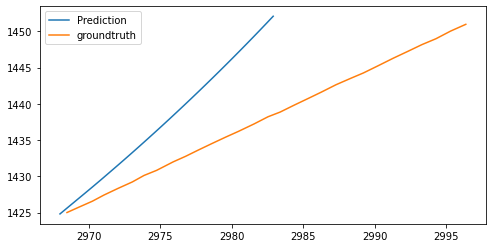

In [37]:
'''visualize prediction and groundtruth'''
model.eval()
model2.eval()
with torch.no_grad():
    for i_batch, sample_batch in enumerate(val_loader):
        #inp: 1 x 60 x 19 x 4
        inp,out,agent_idx = sample_batch

        inp = inp.to(device)
        
        out = out.to(device)

        inp = inp.transpose(1,2)#1 x 19 x 60 x 4
        
        out = out.transpose(1,2)#1 x 30 x 60 x 4

        groundtruth_x = out[0,:,int(agent_idx),0]
        groundtruth_y = out[0,:,int(agent_idx),1]

        #target positions and velocities
        last_p_v = inp[:,18,int(agent_idx),:].reshape((1,4))

        #past 5 seconds' velocity
        v_5 = inp[:,14:19,int(agent_idx),2:].reshape((1,10))

        target_trajectories_x = torch.zeros((30))
        target_trajectories_y = torch.zeros((30))
        for i in range(30):
            #predict next x and y, update last_p_v
            new_p = model(last_p_v)#1 x 2
            #store the predicted positions
            target_trajectories_x[i] = new_p[0,0]
            target_trajectories_y[i] = new_p[0,1]
            #predict next vx and vy, update v_5
            new_v = model2(v_5)#1 x 2
            print('x:',new_p[0,0],',y:',new_p[0,1],',vx:',new_v[0,0],',vy:',new_v[0,1])
            #concatenate new p and v
            last_p_v = torch.cat((new_p,new_v),dim=1)#1 x 4
            #discard the oldest v
            v_5 = v_5[:,2:]#1,4,2
            #concatenate the newest v
            v_5 = torch.cat((v_5,new_v),dim=1)
        if i_batch%10 == 0:
            plt.figure(figsize=(8,4))
            plt.plot(target_trajectories_x,target_trajectories_y, label='Prediction')
            plt.plot(groundtruth_x.detach().cpu().numpy(),groundtruth_y.detach().cpu().numpy(),label='groundtruth')
            plt.legend(loc='best')
            plt.show()   
            break
    
            
            

In [16]:
import csv
model.eval()
model2.eval()
with open('submission.csv','a') as csvfile:
    fieldnames=['ID','v1','v2','v3','v4','v5','v6','v7','v8','v9','v10','v11','v12','v13','v14','v15','v16','v17','v18','v19','v20','v21','v22','v23','v24','v25','v26','v27','v28','v29','v30','v31','v32','v33','v34','v35','v36','v37','v38','v39','v40','v41','v42','v43','v44','v45','v46','v47','v48','v49','v50','v51','v52','v53','v54','v55','v56','v57','v58','v59','v60']
    writer = csv.DictWriter(csvfile,fieldnames=fieldnames)
    writer.writeheader()
    with torch.no_grad():
        for i_batch, sample_batch in enumerate(validation_loader):
            #inp: 1 x 60 x 19 x 4
            inp,agent_idx,scene_idx = sample_batch

            inp = inp.to(device)

            agent_idx = int(agent_idx)

            inp = inp.transpose(1,2)#1 x 19 x 60 x 4

            #target positions and velocities
            last_p_v = inp[:,18,int(agent_idx),:].reshape((1,4))

            #past 5 seconds' velocity
            v_5 = inp[:,14:19,int(agent_idx),2:].reshape((1,10))
            
            target_trajectories = torch.zeros((60))
            for i in range(30):
                #predict next x and y, update last_p_v
                new_p = model(last_p_v)#1 x 2
                #store the predicted positions
                target_trajectories[2*i] = new_p[0,0]
                target_trajectories[2*i+1] = new_p[0,1]
                #predict next vx and vy, update v_5
                new_v = model2(v_5)#1 x 2
                print('x:',new_p[0,0],',y:',new_p[0,1],',vx:',new_v[0,0],',vy:',new_v[0,1])
                #concatenate new p and v
                last_p_v = torch.cat((new_p,new_v),dim=1)#1 x 4
                #discard the oldest v
                v_5 = v_5[:,2:]#1,4,2
                #concatenate the newest v
                v_5 = torch.cat((v_5,new_v),dim=1)
                
            #put into csv
            writer.writerow({'ID':scene_idx[0],
                             'v1':target_trajectories[0].item(),
                            'v2':target_trajectories[1].item(),
                            'v3':target_trajectories[2].item(),
                            'v4':target_trajectories[3].item(),
                             'v5':target_trajectories[4].item(),
                             'v6':target_trajectories[5].item(),
                             'v7':target_trajectories[6].item(),
                             'v8':target_trajectories[7].item(),
                             'v9':target_trajectories[8].item(),
                             'v10':target_trajectories[9].item(),
                             'v11':target_trajectories[10].item(),
                             'v12':target_trajectories[11].item(),
                             'v13':target_trajectories[12].item(),
                             'v14':target_trajectories[13].item(),
                            'v15':target_trajectories[14].item(),
                             'v16':target_trajectories[15].item(),
                             'v17':target_trajectories[16].item(),
                             'v18':target_trajectories[17].item(),
                             'v19':target_trajectories[18].item(),
                             'v20':target_trajectories[19].item(),
                             'v21':target_trajectories[20].item(),
                             'v22':target_trajectories[21].item(),
                             'v23':target_trajectories[22].item(),
                             'v24':target_trajectories[23].item(),
                             'v25':target_trajectories[24].item(),
                             'v26':target_trajectories[25].item(),
                             'v27':target_trajectories[26].item(),
                             'v28':target_trajectories[27].item(),
                             'v29':target_trajectories[28].item(),
                             'v30':target_trajectories[29].item(),
                             'v31':target_trajectories[30].item(),
                             'v32':target_trajectories[31].item(),
                             'v33':target_trajectories[32].item(),
                             'v34':target_trajectories[33].item(),
                             'v35':target_trajectories[34].item(),
                             'v36':target_trajectories[35].item(),
                             'v37':target_trajectories[36].item(),
                             'v38':target_trajectories[37].item(),
                             'v39':target_trajectories[38].item(),
                             'v40':target_trajectories[39].item(),
                             'v41':target_trajectories[40].item(),
                             'v42':target_trajectories[41].item(),
                             'v43':target_trajectories[42].item(),
                             'v44':target_trajectories[43].item(),
                             'v45':target_trajectories[44].item(),
                             'v46':target_trajectories[45].item(),
                             'v47':target_trajectories[46].item(),
                             'v48':target_trajectories[47].item(),
                             'v49':target_trajectories[48].item(),
                             'v50':target_trajectories[49].item(),
                             'v51':target_trajectories[50].item(),
                             'v52':target_trajectories[51].item(),
                             'v53':target_trajectories[52].item(),
                             'v54':target_trajectories[53].item(),
                             'v55':target_trajectories[54].item(),
                             'v56':target_trajectories[55].item(),
                             'v57':target_trajectories[56].item(),
                             'v58':target_trajectories[57].item(),
                             'v59':target_trajectories[58].item(),
                             'v60':target_trajectories[59].item(),
                            })

x: tensor(1714.5068, device='cuda:0') ,y: tensor(336.9096, device='cuda:0') ,vx: tensor(9.3480, device='cuda:0') ,vy: tensor(8.7473, device='cuda:0')
x: tensor(1715.2056, device='cuda:0') ,y: tensor(337.5443, device='cuda:0') ,vx: tensor(10.7968, device='cuda:0') ,vy: tensor(11.1970, device='cuda:0')
x: tensor(1716.0261, device='cuda:0') ,y: tensor(338.3796, device='cuda:0') ,vx: tensor(9.9686, device='cuda:0') ,vy: tensor(10.2662, device='cuda:0')
x: tensor(1716.7781, device='cuda:0') ,y: tensor(339.1377, device='cuda:0') ,vx: tensor(9.0812, device='cuda:0') ,vy: tensor(8.8180, device='cuda:0')
x: tensor(1717.4554, device='cuda:0') ,y: tensor(339.7769, device='cuda:0') ,vx: tensor(9.5202, device='cuda:0') ,vy: tensor(9.5172, device='cuda:0')
x: tensor(1718.1697, device='cuda:0') ,y: tensor(340.4733, device='cuda:0') ,vx: tensor(9.7311, device='cuda:0') ,vy: tensor(9.7986, device='cuda:0')
x: tensor(1718.9011, device='cuda:0') ,y: tensor(341.1928, device='cuda:0') ,vx: tensor(9.5878, d

In [ ]:
'''之前不准确的模型，只用x, vx预测x, vx'''




'''train only x'''
import time
num_epochs = 11
loss_ema = -1
loss_ema2 = -1

model.train()
for epoch in range(num_epochs):
    t0 = time.time()
    loss_over_time = []
    for i_batch, sample_batch in enumerate(val_loader):
        inp, out, agent_idx = sample_batch
        inp = inp.to(device)#500 x 60 x 19 x 4
        out = out.to(device)#500 x 60 x 30 x 4
        
        mixed = torch.cat((inp,out),dim=2)#500 x 60 x 49 x 4
        mixed = torch.transpose(mixed, 2,1)# 500 x 49 x 60 x 4
        mixed = torch.cat((mixed[:,:,:,0].reshape((batch_sz,49,60,1)),mixed[:,:,:,2].reshape((batch_sz,49,60,1))),dim=3)
                
        #500 x 49 x 2
        for i in range(batch_sz):
            if i == 0:
                target_trajectories = mixed[i,:,int(agent_idx[i]),:].reshape(1,49,2)#49 x 4
            target_trajectories = torch.cat((target_trajectories,mixed[i,:,int(agent_idx[i]),:].reshape(1,49,2)),dim=0)#49 x 4
        '''training'''
        for i in range(48):
            print('\n++++++++++++++\n')
            #input = 500 x 2
            #y_pred = 500 x 1
            y_pred = model(target_trajectories[:,i,:])
            loss = (torch.mean((y_pred - target_trajectories[:,i+1,0])**2))**0.5
            loss_over_time.append(loss)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            if loss_ema <0:
                loss_ema = loss
            loss_ema = loss_ema*0.99+loss*0.01
            
            with torch.no_grad():
                test_y = model(target_trajectories[:,i,:])
                print('predict x:',test_y[0,0])
                print('true x: ',target_trajectories[0,i+1,0])
                test_loss = (torch.mean((test_y - target_trajectories[:,i+1,0])**2))**0.5
                if loss_ema2 < 0:
                    loss_ema2 = test_loss
                loss_ema2 = loss_ema*0.99+loss*0.01
        if i_batch%10 == 0:
            print('loss full','epoch=',epoch, 'batch=',i_batch,'ema=',loss_ema.item(),'loss=',loss.item())
            print('loss test','epoch=',epoch, 'batch=',i_batch,'ema=',loss_ema2.item(),'loss=',test_loss.item())
    t1 = time.time()
    plt.figure(figsize=(8,4))
    plt.plot(loss_over_time, label='Train Loss')
    plt.show()   
    
    total = t1-t0
    print('epoch time:',total)
            
            

In [ ]:
'''DNN 1'''
import time
num_epochs = 11
loss_ema = -1

model.train()
for epoch in range(num_epochs):
    t0 = time.time()
    loss_over_time = []
    for i_batch, sample_batch in enumerate(val_loader):
        inp, out = sample_batch
        inp = inp.to(device)#500 x 60 x 19 x 4
        out = out.to(device)#500 x 60 x 30 x 4
        
        #500 x 60 x 49 x 4
        inp = torch.cat((inp,out),dim=2)
        '''process input'''
        position_x_reuse = inp[:,:,:,0].reshape((batch_sz,60,49,1))
        velocity_x = inp[:,:,:,2].reshape((batch_sz,60,49,1))
        position_y_reuse = inp[:,:,:,1].reshape((batch_sz,60,49,1))
        velocity_y = inp[:,:,:,3].reshape((batch_sz,60,49,1))
        #500 x 60 x 49 x 2
        inp = torch.cat((position_x_reuse,velocity_x),dim=3)
        another_inp = torch.cat((position_y_reuse,velocity_y),dim=3)
        #1000 x 60 x 49 x 2
        inp = torch.cat((inp,another_inp),dim=0)
        
        '''process output'''
        position_x = out[:,:,:,0].reshape((batch_sz,60,30,1))
#         velocity_x = out[:,:,:,2].reshape((batch_sz,60,30,1))
        position_y = out[:,:,:,1].reshape((batch_sz,60,30,1))
#         velocity_y = out[:,:,:,3].reshape((batch_sz,60,30,1))
        #500 x 60 x 19 x 2
#         out = torch.cat((position_x,velocity_x),dim=3)
#         another_out = torch.cat((position_y,velocity_y),dim=3)
        #1000 x 60 x 19 x 2
        out = torch.cat((position_x,position_y),dim=0)

        
        
        
        '''training'''
        for i in range(30):
            #input = 1000 x 60*19*2
            #y_pred = 1000 x 60
            y_pred = model(inp[:,:,i:i+19,:].reshape((2*batch_sz,-1)))
            loss = (torch.mean((y_pred - out[:,:,i,:].reshape((2*batch_sz,-1)))**2))**0.5
            loss_over_time.append(loss)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            if loss_ema <0:
                loss_ema = loss
            loss_ema = loss_ema*0.99+loss*0.01
        
        if i_batch%10 == 0:
            print('loss full','epoch=',epoch, 'batch=',i_batch,'ema=',loss_ema.item(),'loss=',loss.item())
    t1 = time.time()
    plt.figure(figsize=(8,4))
    plt.plot(loss_over_time, label='Train Loss')
    plt.show()   
    
    total = t1-t0
    print('epoch time:',total)
            
            

In [ ]:
model.eval()
with torch.no_grad():
    for i_batch, sample_batch in enumerate(validation_loader):
        #inp: 1 x 60 x 19 x 1
        inp,agent_idx,scene_idx = sample_batch

        inp = inp.to(device)

        agent_idx = int(agent_idx)

        p_x = inp[:,:,:,0].reshape((1,60,19,1))
        v_x = inp[:,:,:,2].reshape((1,60,19,1))
        p_y = inp[:,:,:,1].reshape((1,60,19,1))
        v_y = inp[:,:,:,3].reshape((1,60,19,1))

        #1 x 60 x 19 x 2
        x_inp = torch.cat((p_x, v_x),dim=3)
        y_inp = torch.cat((p_y, v_y),dim=3)

        for i in range(30):
            predict_x = model(x_inp.reshape((1,-1)))
            predict_y = model(y_inp.reshape((1,-1)))
            print('predict_x = ',predict_x)

            prev_x = p_x[:,:,i,:].reshape(-1)
            prev_y = p_y[:,:,i,:].reshape(-1)
            
            predict_vx = (predict_x - prev_x)/0.1
            predict_vy = (predict_y - prev_y)/0.1

            predict_vx = predict_vx.reshape((1,60,1,1))
            predict_x = predict_x.reshape((1,60,1,1))
            predict_vy = predict_vy.reshape((1,60,1,1))
            predict_y = predict_y.reshape((1,60,1,1))

            xvx = torch.cat((predict_x, predict_vx),dim=3)
            yvy = torch.cat((predict_y,predict_vy),dim=3)

            p_x = torch.cat((p_x,predict_x),dim=2)
#             v_x = torch.cat((v_x,predict_vx),dim=2)
            p_y = torch.cat((p_y,predict_y),dim=2)
#             v_y = torch.cat((v_y,predict_vy),dim=2)
            
            x_inp = torch.cat((x_inp, xvx),dim=2)
            y_inp = torch.cat((y_inp,yvy),dim=2)
            x_inp = x_inp[:,:,1:,:]
            y_inp = y_inp[:,:,1:,:]


### Visualize the batch of sequences

In [ ]:
import matplotlib.pyplot as plt
import random

agent_id = 0

def show_sample_batch(sample_batch, agent_id):
    """visualize the trajectory for a batch of samples with a randon agent"""
    inp, out = sample_batch
    batch_sz = inp.size(0)
    agent_sz = inp.size(1)
    
    fig, axs = plt.subplots(1,batch_sz, figsize=(15, 3), facecolor='w', edgecolor='k')
    fig.subplots_adjust(hspace = .5, wspace=.001)
    axs = axs.ravel()   
    for i in range(batch_sz):
        axs[i].xaxis.set_ticks([])
        axs[i].yaxis.set_ticks([])
        
        # first two feature dimensions are (x,y) positions
        axs[i].scatter(inp[i, agent_id,:,0], inp[i, agent_id,:,1])
        axs[i].scatter(out[i, agent_id,:,0], out[i, agent_id,:,1])

        
for i_batch, sample_batch in enumerate(val_loader):
    inp, out, lane, lane_norm = sample_batch
    """TODO:
      Deep learning model
      training routine
    """
#     fig = plt.figure(figsize=(25, 10), dpi=80)
#     ax1 = fig.add_subplot(111)
    
#     ax1.scatter(lane[:9,0], lane[:9,1], c='b', marker="s")
#     ax1.scatter(lane[9:18,0], lane[9:18,1], c='r', marker="o")
#     ax1.scatter(lane[18:27,0], lane[18:27,1], c='g', marker="s")
#     ax1.scatter(lane[27:36,0], lane[27:36,1], c='pink', marker="o")
#     ax1.scatter(lane[36:45,0], lane[36:45,1], c='y', marker="s")
#     ax1.scatter(lane[45:54,0], lane[45:54,1], c='gray', marker="o")
#     ax1.scatter(lane[54:63,0], lane[54:63,1], c='hotpink', marker="s")
#     ax1.scatter(lane[64:72,0], lane[64:72,1], c='cyan', marker="o")
#     show_sample_batch(sample_batch, agent_id)
    break